In [247]:
import pandas as pd 
import seaborn as sns
from pandas import Series, DataFrame
from matplotlib import pyplot as plt
from sklearn import preprocessing
import pylab
import missingno as msno
import scipy.stats as stats
from scipy.stats import shapiro
import scipy
from numbers import Number
import statsmodels.api as sm
import statsmodels.stats.api as sms
import numpy as np 
from sklearn import tree
from scipy.stats import levene
from scipy.stats import f_oneway
from scipy.stats import pearsonr
import statsmodels.formula.api as smf
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
from skompiler import skompile
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from matplotlib import pyplot as plt
from sklearn import model_selection
from yellowbrick.cluster import KElbowVisualizer
from warnings import filterwarnings
from sklearn.neural_network import MLPRegressor,MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
filterwarnings("ignore")

class Information():
    def __init__(self,data):
        self.data=data
        
    def Describe(self):
        print(self.data.describe().T)
        
    def Info(self):
        print(self.data.info())
        
    def Head(self):
        print(self.data.head())
              
    def ColumnTypes(self):
        print(self.data.dtypes)
              
    def NullValues(self):
        print(self.data.isnull().values.any())
        print(self.data.isnull().sum())
              
    def Count(self):
        print(self.data.count())
              
    def Num_data(self):
        print(self.data.select_dtypes(include=['float64','int64']))
              
    def Cat_data(self):
        print(self.data.select_dtypes(include=["object"]))
              
    def nuniques(self):
        unique = self.data.nunique()
        return unique
        
              
class Visualization():
    def __init__(self,data):
        self.data = data
        
    def barplot(self,x,y,z = None):
        bar = sns.barplot(x = x, y = y, hue = z, data = self.data);
        return bar
    def frekans(self, x):
        fre = self.data[str(x)].value_counts().plot.barh()
        return fre
    
    def catplot(self, x, y, z = None):
        cat = sns.catplot(x = x, y = y, hue = z, data = self.data);
        return cat
    
    def histogram(self,x, y = None):
        hist = sns.FacetGrid(self.data,hue = y,height = 5).map(sns.kdeplot, x, shade= True).add_legend();
        return hist
    
    def boxplot(self,x, y = None, z = None):
        box = sns.boxplot(x = x, y = y, hue = z, data=self.data);
        return box
    
    def crosstab(self, col1, col2, normalize=None):
        return pd.crosstab(index=self.data[str(col1)], columns=self.data[str(col2)])
    
    def violin(self, x , y , z = None):
        vio = sns.catplot(x= x, y = y, hue = z, kind = "violin", data = self.data);
        return vio
    
    def distplot(self, col1):
        dist = sns.distplot(self.data[str(col1)], bins = 10, kde = False);
        return dist
    
    def jointplot(self,x,y):
        joint = sns.jointplot(x = x, y = y ,data = self.data, kind="reg");
        return joint
    
    def scatter(self, x, y, z = None, s = None):
        sca = sns.scatterplot(x = x, y = y, hue=z, size = s, data = self.data);
        return sca
    
    def lmplot(self, x, y, z = None, c = None, r = None):
        lm = sns.lmplot(x = x, y = y, hue = z, col = c, row = r, data = self.data);
        return lm
    
    def pairplot(self, x = None):
        pair = sns.pairplot(self.data, kind = "reg", hue = x);
        return pair
    
    def heatmap(self):
        heat = sns.heatmap(self.data, annot = True, fmt = "d");
        return heat
    
    def corr(self):      
        fig,ax = plt.subplots(figsize=(7, 7))
        sns.heatmap(self.data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
        plt.show()
    
    def dendogram(self):
        dendogram = msno.dendrogram(self.data)
        return dendogram
    
    def probplot(self, col):
        prob = stats.probplot(self.data[col],dist='norm',plot=pylab)
        pylab.show()
    
    def lineplot(self, x, y, z = None, s = None):
        lin = sns.lineplot(x = x, y = y, hue = z, style = s, markers = True,  dashes = False, data = self.data);
        return lin
    
    def countplot(self, column):
        count = sns.countplot(self.data.iloc[:,column], data = self.data, palette = "Set3");
        return count

    def PieChart(self):
        pie = plt.pie(self.data, labels = self.data.index, counterclock = False, shadow = True)
        return pie 
        
              
class PreProcessing:
    
    def __init__(self, data):
        self.data = data
        
    def dropna(self):
        return self.data.dropna()

    def Delete_col(self, inplace):
        del_col = self.data.dropna(axis=1, inplace=inplace)
        return del_col
    
    def Delete_row(self, inplace):
        del_row = self.data.dropna(axis=0, inplace=inplace)
        return del_row
    
    def calc_vif(self):
        vif["variables"] = self.data.columns
        vif["VIF"] = [variance_inflation_factor(self.data.values, i) for i in range(self.data.shape[1])]
        return(vif)

    def Dummy(self):
        dummy_data = pd.get_dummies(self.data)
        return dummy_data
    
    def normalization(self):
        return preprocessing.normalize(self.data)
    
    def outlier(self):
        lower_and_upper = {}
        columns = list(self.data.select_dtypes(include=["float64","int64"]))
        for col in columns:
            q1 = self.data[col].quantile(0.25)
            q3 = self.data[col].quantile(0.75)
            iqr = 1.5*(q3-q1)
    
            lower_bound = q1-iqr
            upper_bound = q3+iqr
    
            lower_and_upper[col] = (lower_bound, upper_bound)
            self.data.loc[(self.data.loc[:,col]<lower_bound),col]=lower_bound
            self.data.loc[(self.data.loc[:,col]>upper_bound),col]=upper_bound
         
        return self.data

    def DropColumn(self, column):
        drop =  self.data.drop(column, inplace=True, axis=1)
        return drop

    def Label_Encoder(self, column):
        label_encoder = preprocessing.LabelEncoder()
        LE = label_encoder.fit_transform(self.data[column])
        return LE
    
    def standardization(self):
        st_data = preprocessing.scale(self.data)
        return st_data

    
              
class statistic():
    def __init__(self, data):
        self.data=data
        
        
    def shapiro(self):
        for col in self.data.columns[1:]:
            if self.data[col].dtypes != object:
                stat, p = shapiro(self.data[col])
                print('Shapiro Statistics=%.3f, p=%.3f' % (stat, p))
                alpha = 0.05
                if p > alpha:
                    print(col)
                    print('\033[1m'+ col + '\033[0m','Örneklem Normal (Gaussian) dağılımdan gelmektedir (fail to Reject) \n')
                else:
                    print('\033[1m'+ col + ":"+'\033[0m','Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)\n')
        
    def chi2(self,col1,col2): 
        cross=pd.crosstab(index=self.data[col2], columns=self.data[col1])
        chi2,p,dof,expected= stats.chi2_contingency(cross)
        result=[["chi",chi2],["p",p]]
        print(result)
        
    def spearmanr(self, col_1, col_2):
        stats.spearmanr(self.data[col_1],self.data[col_2])
        alpha=0.05
        if(p>alpha):
            print('Statistics=%.3f, p=%.3f' % (stat,p), 'aralarındaki bu ilişki anlamsızdır') 
        else:
            print('Statistics=%.3f, p=%.3f' % (stat,p), 'aralarında bir ilişki vardır ve bu ilişki anlamlıdır')
        
    def ttest_one(self,column,popmean):
        stat, p = self.stats.ttest_one(self.data[column], popmean = popmean)
        print("Statistics:%3.3f, p=%.3f " % (stat,p))
            
    def lev_ttest(self,col1,col2):
        x = Series(self.data[col1].iloc[:][data[col2]==1])
        y = Series(self.data[col1].iloc[:][data[col2]==0])
        print("HİPOTEZ:")
        print("H0:{}-{}=1 and {}-{} =0 have same distribution\n".format(col1,col2,col1,col2))
        stat, p=stats.levene(x,y)
        print("Levene Statistic= {}, p-val={}".format(stat,p))
        if p<0.05:
            print("H0--> Reject. They have different variance\n")
        else:
            print("H0--> Fail to Reject.")
            
        if p<0.05:
            equal_var=False
        else:
            equal_var=True
        print("ttest_two:")
        stat, p=stats.ttest_ind(x,y)
        print("Statistic= {}, p-val={}".format(stat,p))
        if p<0.05:
            print("H0--> Reject. They have different mean\n")
        else:
            print("H0--> Fail to Reject.")
    
    def VIF(self,X):
        vif = pd.DataFrame()
        vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
        vif["features"] = X.columns
        print(vif)
    
    
class Model():
    def __init__(self):
        self.data=data
        
    def train_test_split(self,y,X):
        self.X =X
        self.y =y
        shuffle = input("Please enter shufle: ")
        X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.20,random_state=42,shuffle=shuffle)
        print("X_train",X_train.shape)
        print("y_train",y_train.shape)
        print("X_test",X_test.shape)
        print("y_test",y_test.shape)
        return X_train,X_test,y_train,y_test
    
    def stats_model(self,y,X):
        self.X =X
        self.y =y
        lm = sm.OLS(y,X)
        model = lm.fit()
        model.summary()
        
    def stats_model_2(self,y,X):
        self.X =X
        self.y =y
        loj = sm.Logit(self.y,self.X)
        loj1 = loj.fit()
        print(loj1.summary())   
        
    def Linear_Regresyon(self,X_train=None,X_test=None,y_train=None,y_test=None):
        lm=LinearRegression()
        lr=lm.fit(X_train,y_train)
        return lr
        
    def Linear_Regression_PCA(self,X_train=None,X_test=None,y_train=None,y_test=None):
        pca =PCA()
        
        X_reduced_train = pca.fit_transform(scale(X_train))
        X_reduced_test= pca.fit_transform(scale(X_test))
        
        print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)[0:50])
        
        lm = LinearRegression()
        pcr_model = lm.fit(X_reduced_train, y_train)
        y_pred = pcr_model.predict(X_reduced_test)
        print("RMSE  :" , np.sqrt(mean_squared_error(y_test, y_pred)))
        print("r2_score : " , r2_score(y_test, y_pred))
            
    def Logisctic_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None):

        loj =LogisticRegression(solver = "liblinear")
        loj_model = loj.fit(X_train, y_train)
        print(loj_model)
        print("----------------------------Train---------------")
        print(accuracy_score(y_train,loj_model.predict(X_train)))
        print(confusion_matrix(y_train,loj_model.predict(X_train)))
        print(classification_report(y_train,loj_model.predict(X_train)))
        print("-----------------Test--------------")
        y_pred=loj_model.predict(X_test)
        print(accuracy_score(y_test,y_pred))
        print(confusion_matrix(y_test,y_pred))
        print(classification_report(y_test,y_pred))
        
        
        print(loj_model.predict_proba(X_test)[0:10])
        y_probs=loj_model.predict_proba(X_test)
        y_probs=y_probs[:,1]
        y_pred2=[1 if i>0.4 else 0 for i in y_probs]
        print("iyileştirme")
        print(confusion_matrix(y_test,y_pred2))
        print(classification_report(y_test,y_pred2))
        y_probs=loj_model.predict_proba(X_test)
        y_probs=y_probs[:,1]
        y_pred3=[1 if i>0.2 else 0 for i in y_probs]
        
        print("iyileştirme")
        print(confusion_matrix(y_test,y_pred3))
        print(classification_report(y_test,y_pred3))
        
        print("-----------------Test--------------")
        print(cross_val_score(loj_model,X_test,y_test, cv=10).mean())
        
        print("----------------------------Train---------------")
        print(cross_val_score(loj_model,X_train,y_train, cv=10).mean())
        
        

        logit_roc_auc = roc_auc_score(y_test, loj_model.predict(X_test))

        fpr, tpr, thresholds = roc_curve(y_test, loj_model.predict_proba(X_test)[:,1])
        print("-----------------Test--------------")

        plt.figure()
        plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Oranı')
        plt.ylabel('True Positive Oranı')
        plt.title('ROC')
        plt.show()
        
        print("----------------------------Train---------------")
        logit_roc_auc=roc_auc_score(y_train,loj_model.predict(X_train))
        fpr, tpr, thresholds = roc_curve(y_train, loj_model.predict_proba(X_train)[:,1])
        plt.figure()
        plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Oranı')
        plt.ylabel('True Positive Oranı')
        plt.title('ROC')
        plt.show()
        return loj_model
        
        
        
        
    def Model_Tuning(self,X_train= None,y_train = None,params= None,model=None):
        model_cv = GridSearchCV(model, params, cv=10, n_jobs = -1, verbose = 2)
        model_tuned = model_cv.fit(X_train, y_train)
        print("En iyi parametreler: " + str(model_tuned.best_params_))
        return model_tuned.best_params_
        
    def NN_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        mlpc = MLPClassifier(**best_params)
        mlpc.fit(X_train_scaled, y_train)
        print(mlpc)
        y_pred = mlpc.predict(X_test_scaled)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return mlpc
        
        
    def CART_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cart = DecisionTreeClassifier(**best_params)
        cart_model = cart.fit(X_train, y_train)
        print(cart_model)
        
        fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,50), dpi=300)

        tree.plot_tree(cart_model,
           filled = True);

        fig.savefig('tree_class.png')
        print(skompile(cart_model.predict).to("python/code"))
        y_pred = cart_model.predict(X_test)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        
        print("------------------confusion_matrix------------------")
        print(confusion_matrix(y_test,y_pred))
        return cart
        
    def RF_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        rf_model = RandomForestClassifier(**best_params).fit(X_train, y_train)
        print(rf_model)
        y_pred = rf_model.predict(X_test)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        print("------------------confusion_matrix------------------")
        print(confusion_matrix(y_test,y_pred))
        
        Importance = pd.DataFrame({"Importance": rf_model.feature_importances_*100},
                         index = X_train.columns)
        Importance.sort_values(by = "Importance", 
                       axis = 0, 
                       ascending = True).plot(kind ="barh", color = "r")

        plt.xlabel("Değişken Önem Düzeyleri")
        return rf_model
        
    def NN_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        mlp_model = MLPRegressor(**best_params,hidden_layer_sizes = (100,20)).fit(X_train_scaled, y_train)
        print(mlp_model)
        y_pred = mlp_model.predict(X_test_scaled)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return mlp_model
        
    def CART_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cart_model = DecisionTreeRegressor(**best_params)
        cart_model.fit(X_train, y_train)
        fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,50), dpi=300)
        tree.plot_tree(cart_model,
                   filled = True);
        fig.savefig('tree_reg.png')
        
        print(skompile(cart_model.predict).to('python/code'))
        y_pred =cart_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return cart_model
        
        
    def RF_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        rf_model = RandomForestRegressor(**best_params)
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        
        Importance = pd.DataFrame({"Importance": rf_model.feature_importances_*100},
                         index = X_train.columns)
        Importance.sort_values(by="Importance", axis=0, ascending=True).plot(kind="barh", color="r")
        plt.xlabel("Degiskenlerin Onem Duzeyleri")
        plt.show()
        return rf_model
        
    def SVR(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        svr = SVR(**best_params).fit(X_train, y_train)
        print(svr)
        y_pred = svr.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return svr
        
    def CatBoostRegressor(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        catb = CatBoostRegressor(**best_params)
        catb_model = catb.fit(X_train, y_train)
        print(catb_model)
        y_pred = catb_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return catb_model
    
    def KNeighborsRegressor(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        knn_model = KNeighborsRegressor(**best_params).fit(X_train, y_train)
        print(knn_model)
        print(knn_model.n_neighbors)
        print(knn_model.effective_metric_)
        y_pred = knn_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        RMSE = [] 
        RMSE_CV = []
        for k in range(10):
            k = k+1
            knn_model = KNeighborsRegressor(n_neighbors = k).fit(X_train, y_train)
            y_pred = knn_model.predict(X_train) 
            rmse = np.sqrt(mean_squared_error(y_train,y_pred)) 
            rmse_cv = np.sqrt(-1*cross_val_score(knn_model, X_train, y_train, cv=10, 
                                         scoring = "neg_mean_squared_error").mean())
            RMSE.append(rmse) 
            RMSE_CV.append(rmse_cv)
            print("k =" , k , "için RMSE değeri: ", rmse, "RMSE_CV değeri: ", rmse_cv )
        return knn_model
    
    def KMEANS(self,X_train=None,X_test=None,y_train=None,y_test=None):
        pca = PCA(n_components=10)
        X_reduced_train = pca.fit_transform(scale(X_train))
        X_reduced_test = pca.fit_transform(scale(X_test))
        pca_data = pca.fit_transform(scale(data))
        pca_data = pd.DataFrame(pca_data)
        print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals = 4) * 100))
        n_cluster = input("Please enter n_cluster: ")
        kmeans = KMeans(n_clusters=n_cluster)
        k_fit = kmeans.fit(data_pca)
        print(k_fit.cluster_centers_)
        print(k_fit.labels_)
        visualizer = KElbowVisualizer(kmeans, k=(2,50))
        visualizer.fit(data_pca)
        visualizer.poof()
        n_cluster = input("Please enter n_cluster: ")
        kmeans = KMeans(n_clusters= n_cluster)
        k_fit = kmeans.fit(data_pca)
        kumeler = k_fit.labels_
        merkezler = k_fit.cluster_centers_
        plt.scatter(data_pca.iloc[:,0], data_pca.iloc[:,1], merkezler, c= kumeler,  cmap = "viridis")
        plt.scatter(merkezler[:,0], merkezler[:,1], c="black", s= 200, alpha = 0.5)
        
    def NaiveBayes(self,X_train=None,X_test=None,y_train=None,y_test=None):
        scaler = MinMaxScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        nb = MultinomialNB()
        nb_model = nb.fit(X_train_scaled, y_train)
        print(nb_model)
        y_pred = nb_model.predict(X_test_scaled)
        print("Test başarı oranı")
        print(accuracy_score(y_test, y_pred))
        y_pred = nb_model.predict(X_train_scaled)
        print("Train başarı oranı")
        print(accuracy_score(y_train, y_pred))
        
    def SVC(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        svc_model = SVC(**best_params)
        svc_model.fit(X_train, y_train)
        print(svc_model)
        y_pred = svc_model.predict(X_test)
        print("Test başarı oranı")
        print(accuracy_score(y_test, y_pred))
        print(classification_report(y_test,svc_model.predict(X_test)))
        y_pred = svc_model.predict(X_train)
        print("Train başarı oranı")
        print(accuracy_score(y_train, y_pred))
        print(classification_report(y_train,svc_model.predict(X_train)))
        return svc_model
        
        
    def KNeighborsClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        knn = KNeighborsClassifier(**best_params)
        knn_model = knn.fit(X_train, y_train)
        print(knn_model)
        y_pred = knn_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        print(classification_report(y_test, y_pred))
        return knn_model
        
    def CatBoostClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cat_model = CatBoostClassifier(**best_params).fit(X_train, y_train)
        y_pred = cat_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return cat_model
        
    def GradientBoostingClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        gbm_model = GradientBoostingClassifier(**best_params).fit(X_train, y_train)
        y_pred = gbm_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return gbm_model
    
    def Testing(modeller=None,X_test=None,y_test=None):
        for model in modeller:
            isimler = model.__class__.__name__
            y_pred = model.predict(X_test)
            dogruluk = accuracy_score(y_test, y_pred)
            print("-"*28)
            print(isimler + ":" )
            print("Accuracy: {:.4%}".format(dogruluk))
        

In [200]:
hmelq = pd.read_csv("hmelq.csv")
data=hmelq.copy()

Data Description

* Bad = 0 ödenmemiş , 1 ödenmiş
* Loan : Kredi talebi tutarı
* Mortdue : Mevcut borç
* Value : Mevcut mülk degeri
* Reason : DebtCon= borç ödemek için / HomeImp = ev kredisi
* Job : Müşterinin işi 
* Yoj : Müşterinin işindeki senesi
* Derog : Raporların sayısı 
* Delinq : Ödenmemiş kredi limit sayısı
* Clage : En eski kredi limitinin yaşı
* Ninq : Güncel son kredi sorgusunun sayısı
* Clnq : kredi limit sayısı
* Debtinc : Borç / Gelir orani

Veriseti hakkında ön tanımlı bilgiler olarak banka verisi olduğu bilinmektedir. Bu uygulamada amaç müşterilerin borç ödeyip/ödememe alışkanlıklarını farklı sınıflarda geçmişte toplanmış veriler analiz edilerek anlamsalc ilişki çıkartılması ve güçlü tahmin modelleri kurularak en doğru tahmin yapan modellerin seçilerek maksimum kar sağlanmasıdır. 

In [201]:
inf_data = Information(data)
#Data hakkında ön bilgi alınan sınıf

In [202]:
inf_data.Head()

   bad   loan   mortdue     value   reason  job   yoj  derog  delinq   clage  \
0    0  81200   18834.0  108355.0  HomeImp  NaN  28.0    0.0     0.0  139.14   
1    0  12600  103960.0  127384.0  DebtCon  NaN   2.0    0.0     0.0  129.02   
2    0  18000   46865.0   61266.0  DebtCon  NaN   5.0    0.0     0.0  102.59   
3    0  10300   57676.0   71027.0  DebtCon  NaN  19.0    0.0     0.0  157.52   
4    0   9400   56508.0   78358.0  DebtCon  NaN  17.0    0.0     0.0  141.93   

   ninq  clno  debtinc  
0   0.0  14.0   34.042  
1   0.0  25.0   34.479  
2   2.0   9.0   26.354  
3   1.0  11.0   33.992  
4   0.0  11.0   32.327  


In [203]:
inf_data.Info()
# Verisetinin 3576 gozlemden oluştuğu ve 13 adet degiskeni bulunduğu gözlemlenmektedir. "reason" ve "job" degişkeni kategorik degişkendir.
#Bu veriseti için hedef(target) degişken olarak "bad" degişkeni belirlenmiştir. Borç ödeyip ödememe durumuna göre karar verileceği için.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3576 entries, 0 to 3575
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   bad      3576 non-null   int64  
 1   loan     3576 non-null   int64  
 2   mortdue  3262 non-null   float64
 3   value    3512 non-null   float64
 4   reason   3429 non-null   object 
 5   job      3409 non-null   object 
 6   yoj      3264 non-null   float64
 7   derog    3149 non-null   float64
 8   delinq   3225 non-null   float64
 9   clage    3397 non-null   float64
 10  ninq     3273 non-null   float64
 11  clno     3443 non-null   float64
 12  debtinc  2809 non-null   float64
dtypes: float64(9), int64(2), object(2)
memory usage: 363.3+ KB
None


In [204]:
inf_data.Describe()

          count           mean           std      min       25%        50%  \
bad      3576.0       0.199385      0.399594     0.00      0.00      0.000   
loan     3576.0   18529.697987  11262.834060  1100.00  11000.00  16200.000   
mortdue  3262.0   74013.907992  44016.833772  2619.00  46700.25  65858.000   
value    3512.0  101076.922759  54865.275351  8800.00  65753.00  89183.000   
yoj      3264.0       8.832644      7.568046     0.00      3.00      7.000   
derog    3149.0       0.261670      0.865178     0.00      0.00      0.000   
delinq   3225.0       0.432558      1.099230     0.00      0.00      0.000   
clage    3397.0     179.832529     87.066198     0.49    115.60    173.640   
ninq     3273.0       1.186373      1.728723     0.00      0.00      1.000   
clno     3443.0      21.507116     10.167490     0.00     15.00     20.000   
debtinc  2809.0      33.831737      9.061837     0.72     29.14     34.747   

               75%         max  
bad           0.00       1.000

In [205]:
inf_data.ColumnTypes()

bad          int64
loan         int64
mortdue    float64
value      float64
reason      object
job         object
yoj        float64
derog      float64
delinq     float64
clage      float64
ninq       float64
clno       float64
debtinc    float64
dtype: object


In [206]:
inf_data.NullValues()
#Verisetindeki her bir degişkende kaç adet kayıp deger oldugu gözlemlendi.

True
bad          0
loan         0
mortdue    314
value       64
reason     147
job        167
yoj        312
derog      427
delinq     351
clage      179
ninq       303
clno       133
debtinc    767
dtype: int64


In [207]:
inf_data.Count()

bad        3576
loan       3576
mortdue    3262
value      3512
reason     3429
job        3409
yoj        3264
derog      3149
delinq     3225
clage      3397
ninq       3273
clno       3443
debtinc    2809
dtype: int64


In [208]:
inf_data.Num_data()
#Numeric degişkenler gözlemlendi. buradaki "bad" degişkeni aslında 1 ve 0 'lardan oluşan kategorik bir degişkendir.

      bad   loan   mortdue     value   yoj  derog  delinq   clage  ninq  clno  \
0       0  81200   18834.0  108355.0  28.0    0.0     0.0  139.14   0.0  14.0   
1       0  12600  103960.0  127384.0   2.0    0.0     0.0  129.02   0.0  25.0   
2       0  18000   46865.0   61266.0   5.0    0.0     0.0  102.59   2.0   9.0   
3       0  10300   57676.0   71027.0  19.0    0.0     0.0  157.52   1.0  11.0   
4       0   9400   56508.0   78358.0  17.0    0.0     0.0  141.93   0.0  11.0   
...   ...    ...       ...       ...   ...    ...     ...     ...   ...   ...   
3571    1   8400   31800.0   72000.0   NaN    0.0     2.0  187.27   1.0  21.0   
3572    1  21600  154991.0       NaN   NaN    2.0     4.0  165.60   0.0  43.0   
3573    1  24000   35000.0       NaN   3.0    1.0     0.0  177.50   0.0  16.0   
3574    1  10000       NaN   25010.0   5.0    0.0     3.0  326.13   4.0  17.0   
3575    1   5900       NaN   28000.0   1.0    2.0     1.0   36.77   1.0   8.0   

      debtinc  
0      34.0

In [209]:
inf_data.Cat_data()
#Kategorik degişkenler  gözlenlendi."bad" degişkeninde kategorik degişken oldugu unutulmamalıdır.

       reason   job
0     HomeImp   NaN
1     DebtCon   NaN
2     DebtCon   NaN
3     DebtCon   NaN
4     DebtCon   NaN
...       ...   ...
3571  DebtCon  Self
3572  DebtCon  Self
3573  DebtCon  Self
3574  HomeImp  Self
3575  DebtCon  Self

[3576 rows x 2 columns]


In [210]:
inf_data.nuniques()
#Her bir degişkenin sınıf sayısı gözlemlendi. Dikkate alınması gereken kategorik degişken sınmıfları.

bad           2
loan        474
mortdue    3095
value      3302
reason        2
job           6
yoj          86
derog        11
delinq       12
clage      3050
ninq         15
clno         61
debtinc    2653
dtype: int64

Data hakkında ön bilgiye ulaşıldı.

In [211]:
viz_data = Visualization(data)

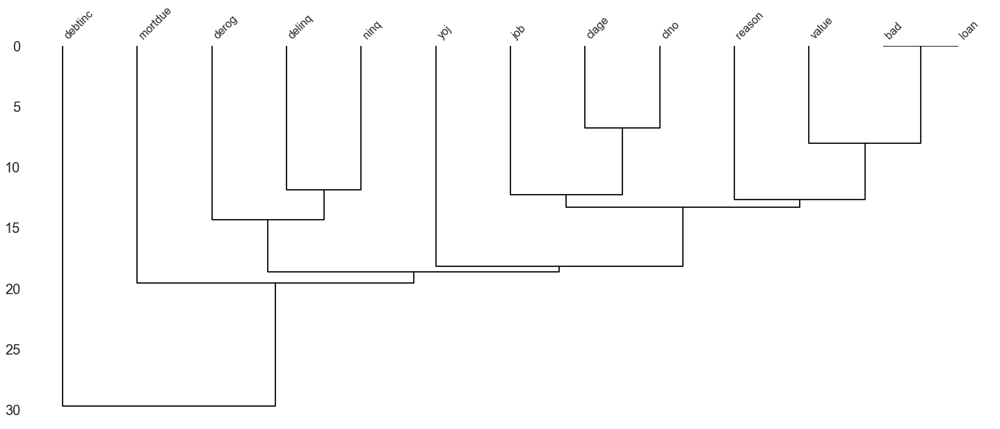

In [212]:
viz_data.dendogram()
#Eksik degerlerin nasıl kümelendiği gözlemlendi.

In [213]:
data = data.dropna()
#data'daki eksik gözlemler atıldı.
inf_data = Information(data)

In [214]:
inf_data.NullValues()

False
bad        0
loan       0
mortdue    0
value      0
reason     0
job        0
yoj        0
derog      0
delinq     0
clage      0
ninq       0
clno       0
debtinc    0
dtype: int64


In [215]:
viz_data = Visualization(data)
#Verisetini görselleştirmek için kullanılan sınıf.

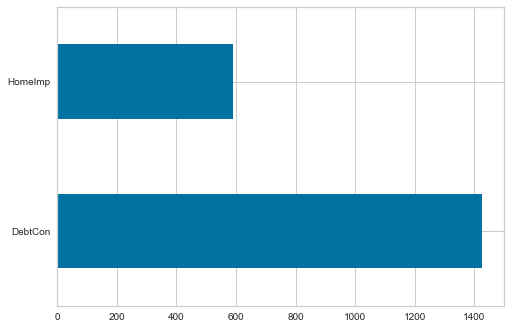

In [216]:
viz_data.frekans(x="reason")
#Reason degişkenin sınıf rekansları gözlemlendi.

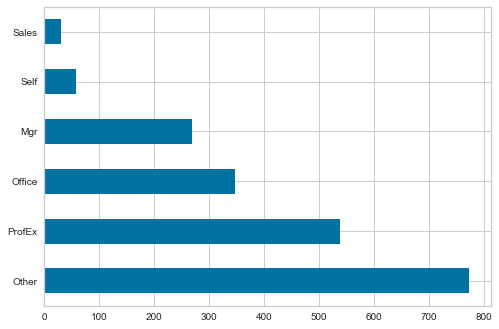

In [166]:
viz_data.frekans(x="job")
#Job degişkenin sınıf rekansları gözlemlendi.

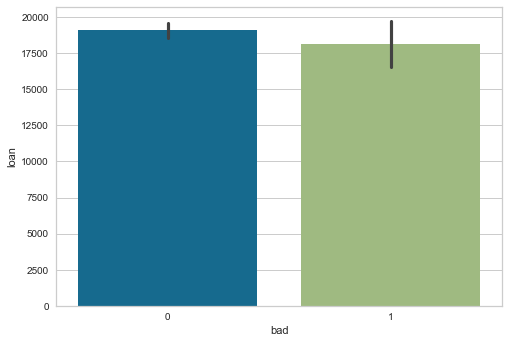

In [167]:
viz_data.barplot(x="bad",y="loan")
# Borcunu ödeyenlerin daha yüksek kredi talep ettikleri gözlemlendi.

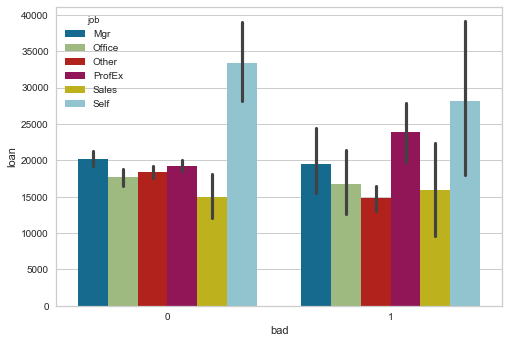

In [895]:
viz_data.barplot(x="bad",y="loan", z="job")
#Kredi talep oranlarının borç ödeme durumu ve mesleklere göre dagılımı gözlemlendi.

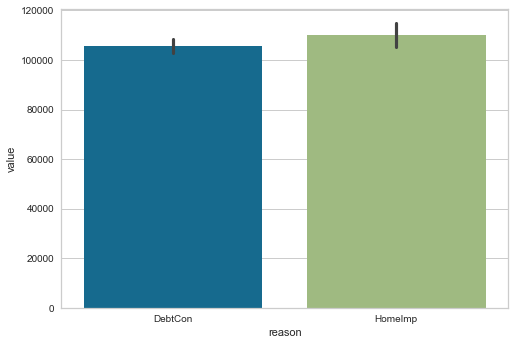

In [604]:
viz_data.barplot(x="reason",y="value")
#Mevcut mülk degeri ile kredi çekme nedeni arasındaki ilişki gözlemlendi.Mülk degeri fazla olanların ev kredisi için kredi talep ettiği gözlemlendi.

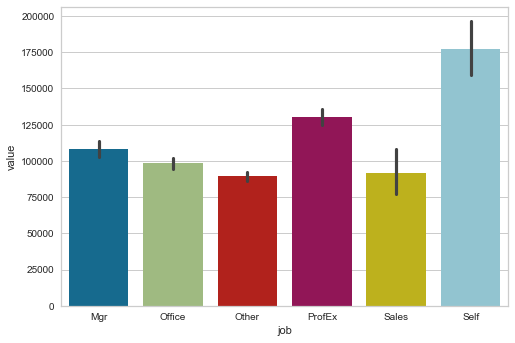

In [500]:
viz_data.barplot(x="job",y="value")
#Müşterilerin çalıştıkları iş ile mevcut mülk degeri gözlemlendi. Knedi işini yapanların 

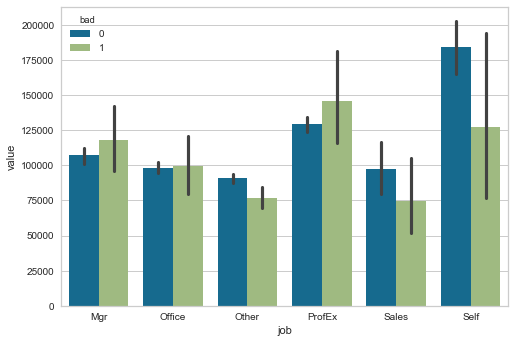

In [501]:
viz_data.barplot(x="job",y="value", z="bad")
#Mevcut mülk degerinin borç ödeyip ödememe durumuna ve hangi meslek grubuna ait oldugu incelenmiştir.

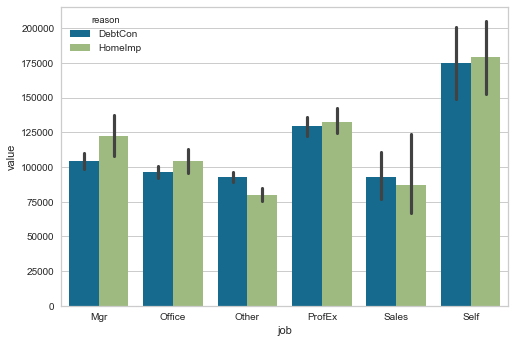

In [502]:
viz_data.barplot(x="job",y="value", z="reason")
#Kredi talep nedeninin, borç ödeme durumu ve mevcut mülk degeri ile ilişkisi gözlemlenmiştir.

In [503]:
data.groupby(["job","reason"])["value"].mean()

job     reason 
Mgr     DebtCon    104175.748815
        HomeImp    122652.103448
Office  DebtCon     96200.744094
        HomeImp    104114.478723
Other   DebtCon     92941.028571
        HomeImp     79682.392523
ProfEx  DebtCon    129185.705714
        HomeImp    132576.211640
Sales   DebtCon     92684.038462
        HomeImp     86986.500000
Self    DebtCon    174611.629630
        HomeImp    179447.322581
Name: value, dtype: float64

In [504]:
viz_data.crosstab("bad","reason")

reason,DebtCon,HomeImp
bad,,
0,1304,536
1,124,54


In [505]:
viz_data.crosstab("bad","job")

job,Mgr,Office,Other,ProfEx,Sales,Self
bad,,,,,,
0,242,326,694,504,23,51
1,27,22,80,35,7,7


In [506]:
viz_data.crosstab("reason","job")

job,Mgr,Office,Other,ProfEx,Sales,Self
reason,,,,,,
DebtCon,211,254,560,350,26,27
HomeImp,58,94,214,189,4,31


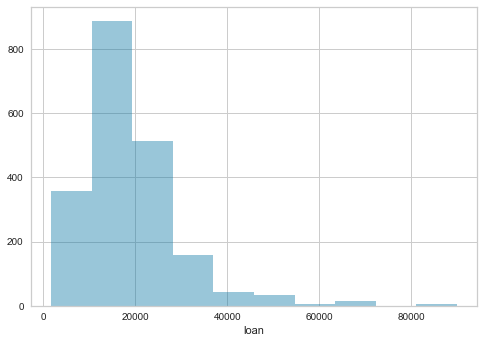

In [507]:
viz_data.distplot("loan")

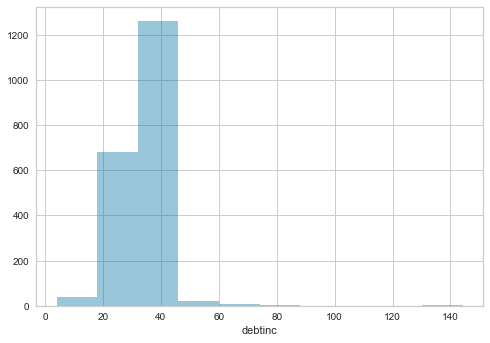

In [508]:
viz_data.distplot("debtinc")

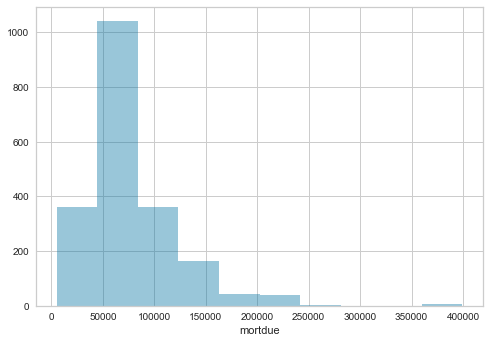

In [509]:
viz_data.distplot("mortdue")

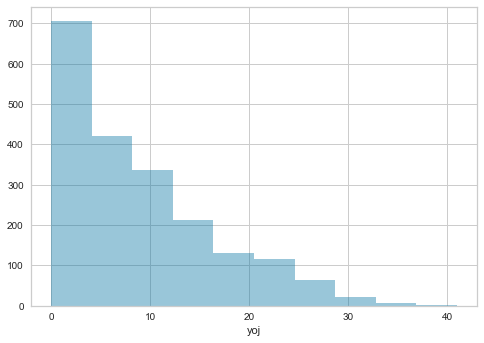

In [510]:
viz_data.distplot("yoj")

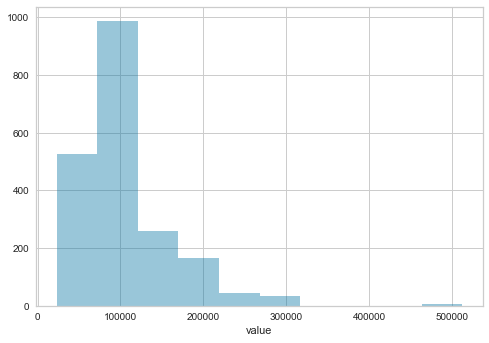

In [511]:
viz_data.distplot("value")

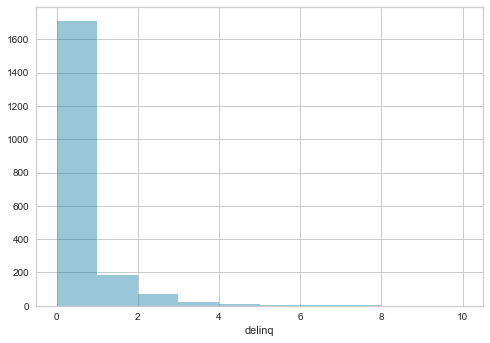

In [512]:
viz_data.distplot("delinq")

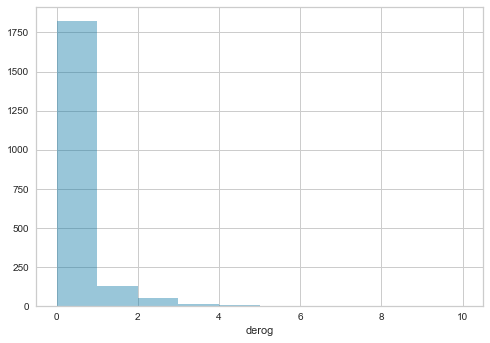

In [513]:
viz_data.distplot("derog")

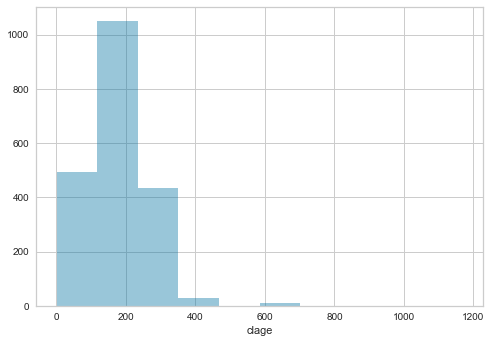

In [514]:
viz_data.distplot("clage")

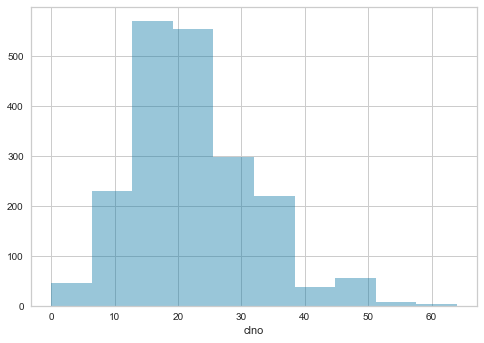

In [515]:
viz_data.distplot("clno")

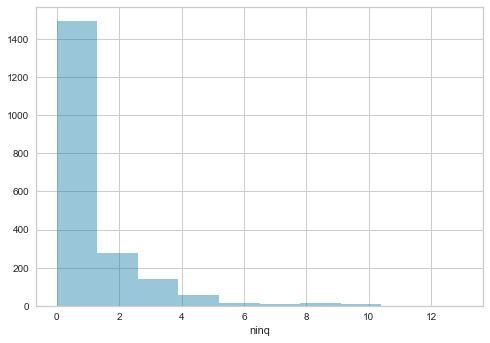

In [516]:
viz_data.distplot("ninq")

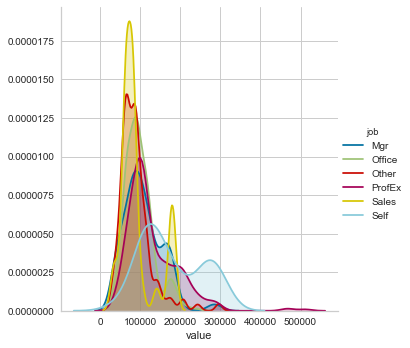

In [517]:
viz_data.histogram("value","job")
#Meslek gruplarının numeric degişken olan value degişkleni içerisindeki dağılımı gözlemlendi.

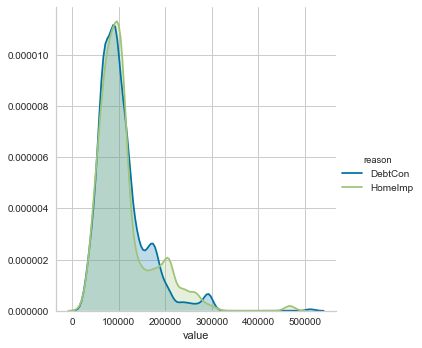

In [518]:
viz_data.histogram("value","reason")

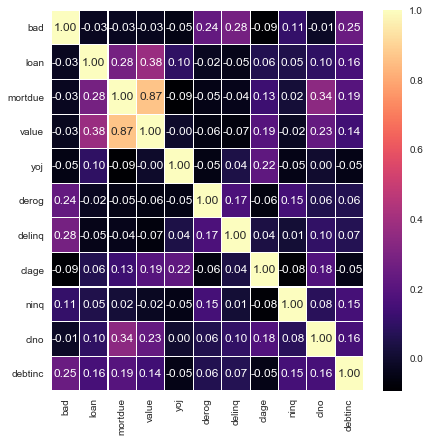

In [519]:
viz_data.corr()
#Korelasyon matrisine bakılarak degişkenler arasındaki ilişki gözlemlenmektedir. 
#"Value" ve "Mortdue" degişkenlerinin yüksek korelasyon gösterdiği gözlemlenilmiştir.
#"bad" degişkeni dikkate alınmayacak !!

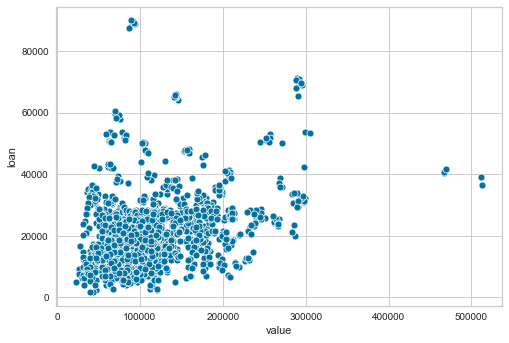

In [520]:
viz_data.scatter("value", "loan")
#Scatterplot ile degişkenlerin kendi aralarından nasıl dagıldığı net bir şekilde gözlemlenmektedir.

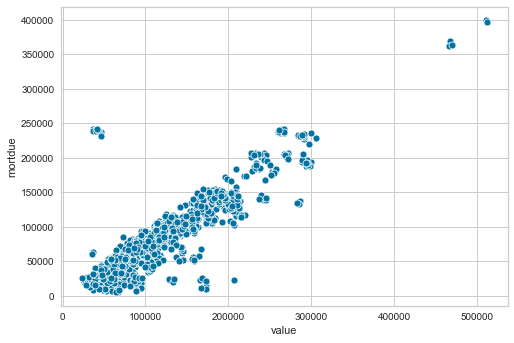

In [521]:
viz_data.scatter("value", "mortdue")

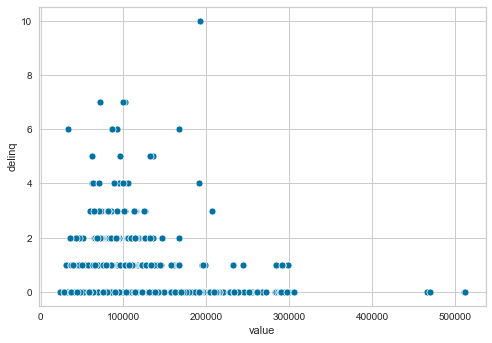

In [522]:
viz_data.scatter("value", "delinq")

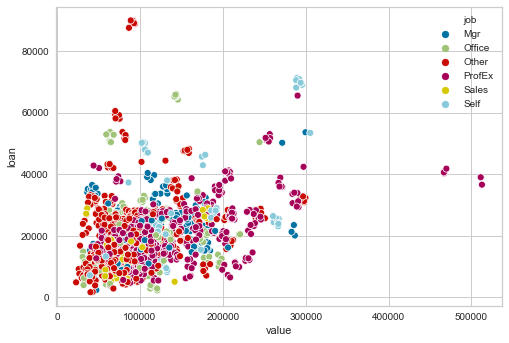

In [523]:
viz_data.scatter("value", "loan", "job")

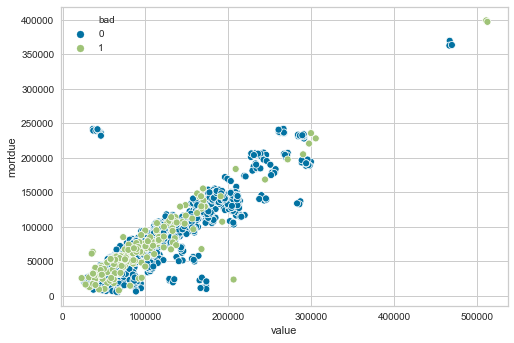

In [524]:
viz_data.scatter("value", "mortdue", "bad")

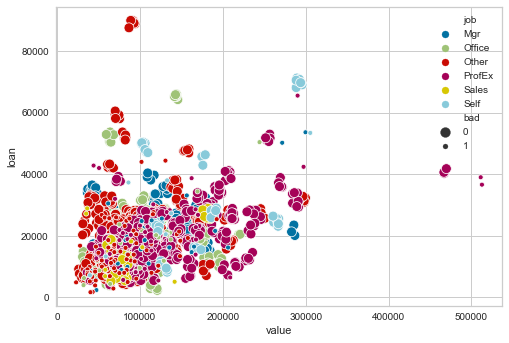

In [525]:
viz_data.scatter("value", "loan", "job", "bad")

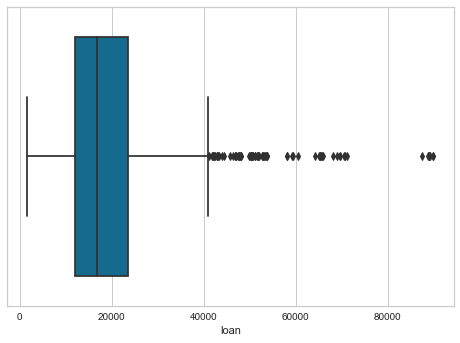

In [526]:
viz_data.boxplot("loan")
#boxplot ile numeric degişkenlerin outlierlerı net bir şekilde gözlemlenebilmektedir.

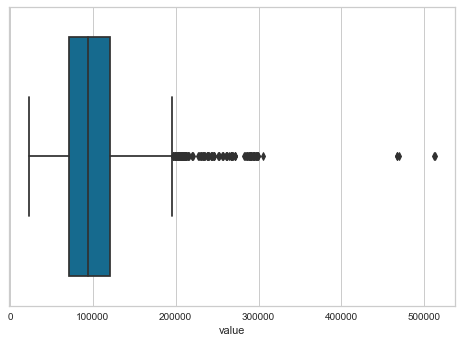

In [527]:
viz_data.boxplot("value")

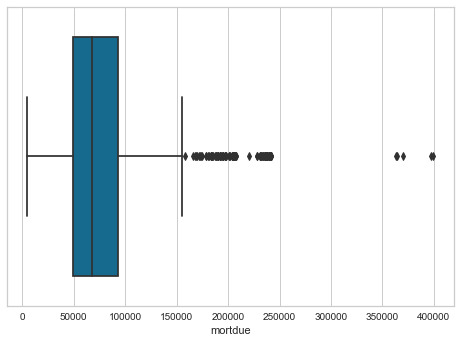

In [528]:
viz_data.boxplot("mortdue")

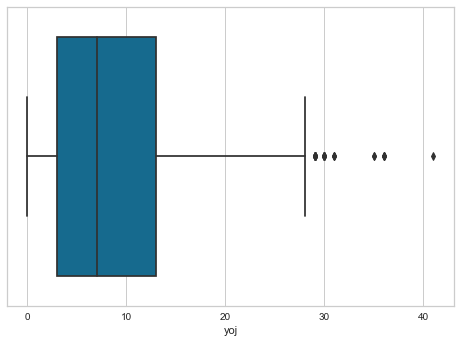

In [529]:
viz_data.boxplot("yoj")

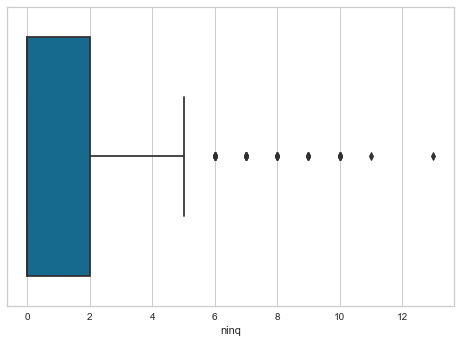

In [530]:
viz_data.boxplot("ninq")

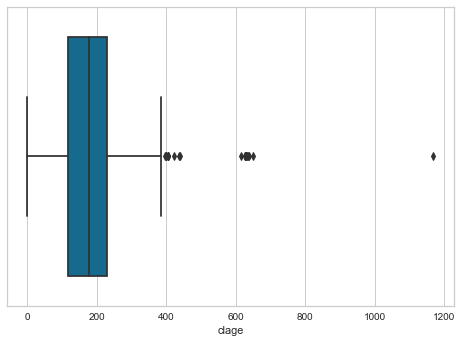

In [531]:
viz_data.boxplot("clage")

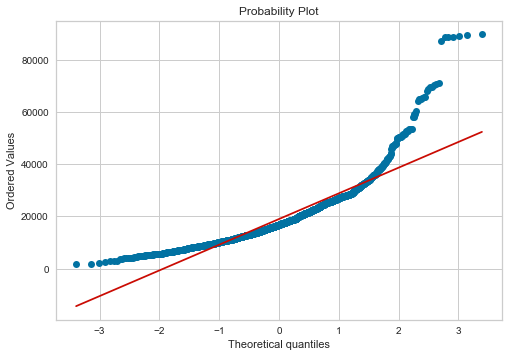

In [532]:
viz_data.probplot("loan")
#probplot ile degişkenlerin normal dağılım gösterip göstermedikleri gözlemlenmektedir.

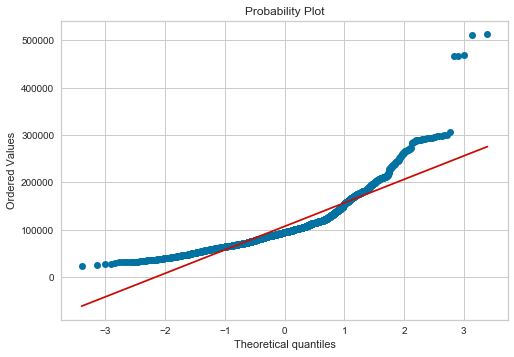

In [533]:
viz_data.probplot("value")

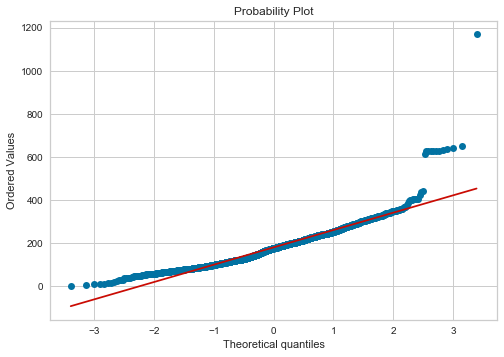

In [534]:
viz_data.probplot("clage")

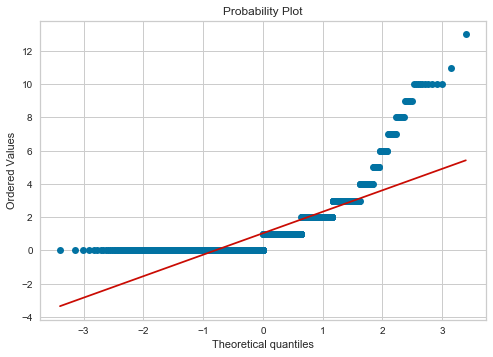

In [535]:
viz_data.probplot("ninq")

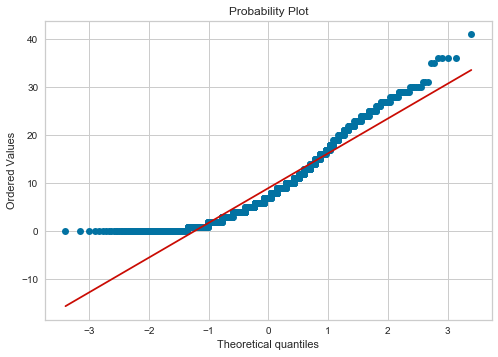

In [536]:
viz_data.probplot("yoj")

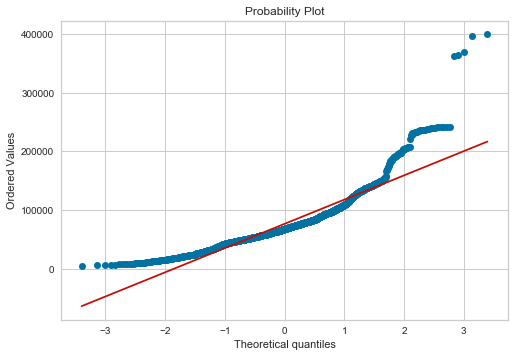

In [537]:
viz_data.probplot("mortdue")

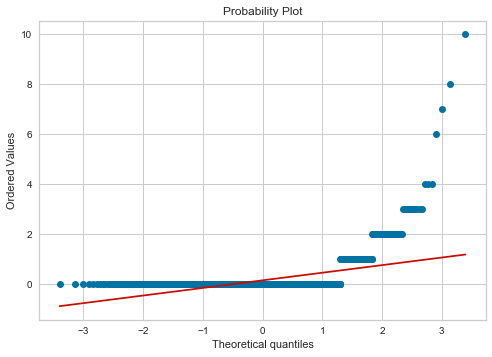

In [538]:
viz_data.probplot("derog")

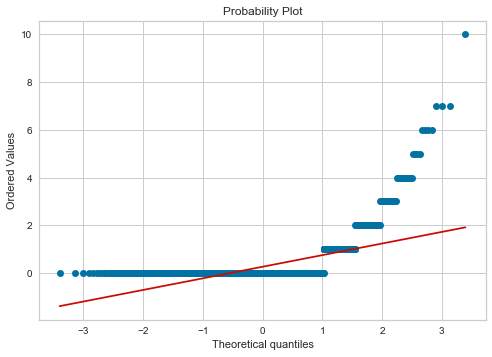

In [539]:
viz_data.probplot("delinq")

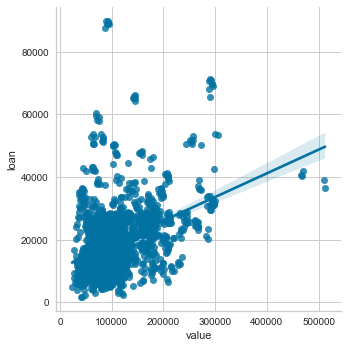

In [540]:
viz_data.lmplot("value", "loan")
#lmplot ile degişkenlerin kendi aralarında düzgün dagılım gösterip göstermeme durumları irdelenir.

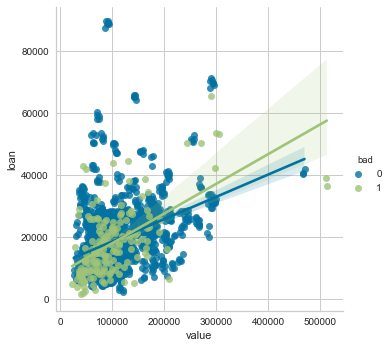

In [541]:
viz_data.lmplot("value", "loan", "bad")

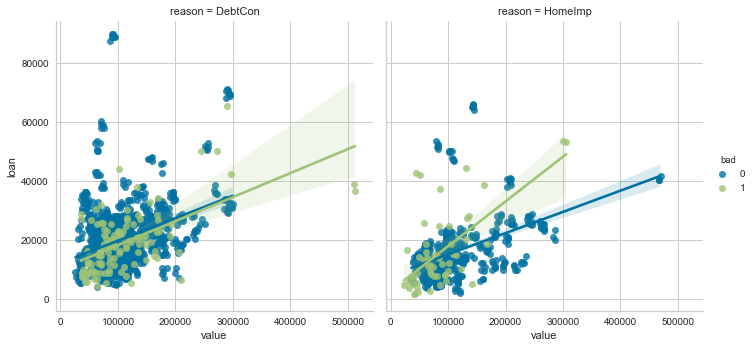

In [542]:
viz_data.lmplot("value", "loan", "bad", "reason")

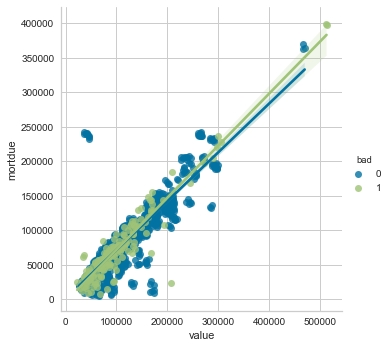

In [543]:
viz_data.lmplot("value", "mortdue", "bad")

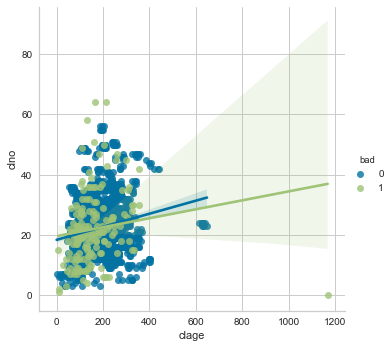

In [544]:
viz_data.lmplot("clage", "clno","bad")

In [187]:
stat_data = statistic(data)
#İstatistik testlerinin yapıldıgı sınıf.

In [188]:
stat_data.chi2("job", "bad")

[['chi', 17.653162201450712], ['p', 0.0034140218372415696]]


In [189]:
stat_data.chi2("reason", "bad")

[['chi', 0.06334081421292037], ['p', 0.8012915011681949]]


job degişkeni bad degişkenini etkilerken reason degişkeninin job degişkeni üstünde bir etkisi olmadıgı gözlemlenmektedir.

In [190]:
stat_data.shapiro()

Shapiro Statistics=0.836, p=0.000
loan: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.862, p=0.000
mortdue: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.844, p=0.000
value: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.912, p=0.000
yoj: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.277, p=0.000
derog: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.380, p=0.000
delinq: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.905, p=0.000
clage: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.669, p=0.000
ninq: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.964, p=0.000
clno: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.824, p=0.000
debtinc: Örnek

Hiçbir degişkenin normal dağılımdan gelmediği gözlemlenmektedir. Yani nonparametriktir.

In [191]:
num_data=data.drop(["bad","job","reason"],axis=1)
for col in num_data.columns:
    stat_data.lev_ttest(col,"bad")

HİPOTEZ:
H0:loan-bad=1 and loan-bad =0 have same distribution

Levene Statistic= 2.3947745891982195, p-val=0.12189825252399986
H0--> Fail to Reject.
ttest_two:
Statistic= -1.176054303533842, p-val=0.23971203285250864
H0--> Fail to Reject.
HİPOTEZ:
H0:mortdue-bad=1 and mortdue-bad =0 have same distribution

Levene Statistic= 2.3073764505136856, p-val=0.12891801775903636
H0--> Fail to Reject.
ttest_two:
Statistic= -1.127470718824357, p-val=0.259677683857574
H0--> Fail to Reject.
HİPOTEZ:
H0:value-bad=1 and value-bad =0 have same distribution

Levene Statistic= 3.9912413972700382, p-val=0.0458714974437462
H0--> Reject. They have different variance

ttest_two:
Statistic= -1.406867566020743, p-val=0.15962080002954823
H0--> Fail to Reject.
HİPOTEZ:
H0:yoj-bad=1 and yoj-bad =0 have same distribution

Levene Statistic= 4.210113592213248, p-val=0.040312559874429624
H0--> Reject. They have different variance

ttest_two:
Statistic= -2.2900393659753835, p-val=0.022121892389347888
H0--> Reject. The

levene ve ttesti sonuçlarına bakıldıgında loan-mortdue ve clage varyansları homojen, value-yoj-derog-delinq-ninq-clno-debtinc varyanslarının homojen olmadıgı gözlemlenmiştir.ttesti ile de anlamlılıkları gözlemlenmiştir.

# Preprocessing

In [217]:
pro_data = PreProcessing(data)

In [218]:
dummy = pro_data.Dummy()
#Dummy encoder ile kategorik degişkenler sınıflarına ayrıştırıldı.

In [219]:
dummy.head()

,bad,loan,mortdue,value,yoj,derog,delinq,clage,ninq,clno,debtinc,reason_DebtCon,reason_HomeImp,job_Mgr,job_Office,job_Other,job_ProfEx,job_Sales,job_Self
153,0,18200,94727.0,136877.0,15.0,0.0,0.0,168.96,2.0,26.0,36.056,1,0,1,0,0,0,0,0
154,0,21700,79240.0,96784.0,5.0,0.0,0.0,64.51,6.0,24.0,38.079,1,0,1,0,0,0,0,0
155,0,34100,241931.0,36486.0,1.0,0.0,2.0,196.01,3.0,50.0,42.459,1,0,1,0,0,0,0,0
156,0,8400,62989.0,76718.0,3.0,0.0,2.0,131.47,0.0,22.0,29.200,0,1,1,0,0,0,0,0
157,0,17400,25859.0,43684.0,16.0,1.0,0.0,95.36,1.0,17.0,27.108,1,0,1,0,0,0,0,0


# Logistic Regression

In [220]:
y=data["bad"]
X_=data.drop(["bad","reason","job"],axis=1).astype("float64")
X=pd.concat([X_,dummy[["reason_HomeImp","job_Mgr","job_Office","job_Other","job_ProfEx","job_Sales","job_Self"]]],axis=1) 
X.head()

,loan,mortdue,value,yoj,derog,delinq,clage,ninq,clno,debtinc,reason_HomeImp,job_Mgr,job_Office,job_Other,job_ProfEx,job_Sales,job_Self
153,18200.0,94727.0,136877.0,15.0,0.0,0.0,168.96,2.0,26.0,36.056,0,1,0,0,0,0,0
154,21700.0,79240.0,96784.0,5.0,0.0,0.0,64.51,6.0,24.0,38.079,0,1,0,0,0,0,0
155,34100.0,241931.0,36486.0,1.0,0.0,2.0,196.01,3.0,50.0,42.459,0,1,0,0,0,0,0
156,8400.0,62989.0,76718.0,3.0,0.0,2.0,131.47,0.0,22.0,29.200,1,1,0,0,0,0,0
157,17400.0,25859.0,43684.0,16.0,1.0,0.0,95.36,1.0,17.0,27.108,0,1,0,0,0,0,0


In [221]:
model = Model()

In [222]:
X_train,X_test,y_train,y_test= model.train_test_split(y,X)

Please enter shufle: 
X_train (1614, 17)
y_train (1614,)
X_test (404, 17)
y_test (404,)


In [30]:
model.stats_model_2(y_train,X_train)

Optimization terminated successfully.
         Current function value: 0.230402
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                    bad   No. Observations:                 1614
Model:                          Logit   Df Residuals:                     1597
Method:                           MLE   Df Model:                           16
Date:                Sat, 22 Aug 2020   Pseudo R-squ.:                  0.2302
Time:                        22:19:20   Log-Likelihood:                -371.87
converged:                       True   LL-Null:                       -483.05
Covariance Type:            nonrobust   LLR p-value:                 2.308e-38
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
loan           -2.206e-05   1.18e-05     -1.871      0.061   -4.52e-05    1.05e-06
mortdue        -2

Tablo istatistiklerine bakıldıgında genellikle p value degerleri yüksek olan degişkenlerin kaldırılması gerekmektedir.

In [31]:
stat_data.VIF(X_train)
#vif testi ile degişkenlerin anlamlılıklaarına bakıldı ve vif degeri 10 degerinden yüksek olan "job_other" degişkeninin anlamsız oldugu gözlemlendi.

    VIF Factor        features
0     1.310539            loan
1     4.800372         mortdue
2     4.900929           value
3     1.136781             yoj
4     1.111956           derog
5     1.077791          delinq
6     1.165968           clage
7     1.102788            ninq
8     1.247195            clno
9     1.125768         debtinc
10    1.100408  reason_HomeImp
11    4.637304         job_Mgr
12    5.326995      job_Office
13   10.782001       job_Other
14    8.204489      job_ProfEx
15    1.465990       job_Sales
16    2.235515        job_Self


In [223]:
X_train=X_train.drop(["value","mortdue","yoj","reason_HomeImp","job_Other"],axis=1)

In [224]:
X_test=X_test.drop(["value","mortdue","yoj","reason_HomeImp","job_Other"],axis=1)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)
----------------------------Train---------------
0.919454770755886
[[1460   11]
 [ 119   24]]
              precision    recall  f1-score   support

           0       0.92      0.99      0.96      1471
           1       0.69      0.17      0.27       143

    accuracy                           0.92      1614
   macro avg       0.81      0.58      0.61      1614
weighted avg       0.90      0.92      0.90      1614

-----------------Test--------------
0.9207920792079208
[[367   2]
 [ 30   5]]
              precision    recall  f1-score   support

           0       0.92      0.99      0.96       369
           1       0.71      0.14      0.24        35

    acc

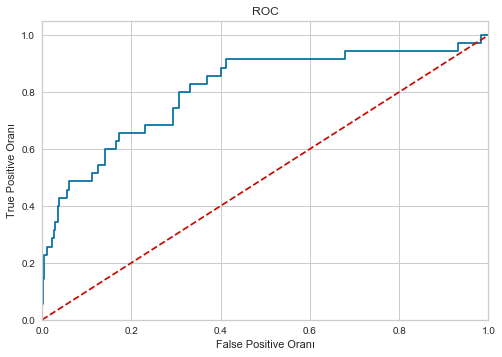

----------------------------Train---------------


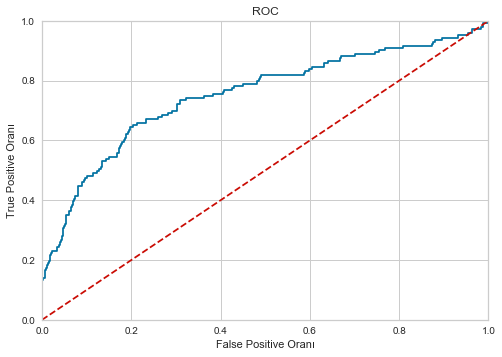

In [225]:
 loj_model = model.Logisctic_Regression(X_train,X_test,y_train,y_test)

# NNCLASSİFİCATİON

In [226]:
best_params = {}
mlpc = model.NN_Classification(X_train,X_test,y_train,y_test,best_params)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)
------------------Accuracy Score------------------
0.943069306930693
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       369
           1       1.00      0.34      0.51        35

    accuracy                           0.94       404
   macro avg       0.97      0.67      0.74       404
weighted avg       0.95      0.94      0.93       404



In [227]:
params = {"alpha": [0.1, 0.01, 0.02, 0.005, 0.0001,0.00001],
              "hidden_layer_sizes": [(10,10,10),
                                     (100,100,100),
                                     (100,100),
                                     (3,5), 
                                     (5, 3)],
              "solver" : ["lbfgs","adam","sgd"],
              "activation": ["relu","logistic"]}
best_params = model.Model_Tuning(X_train,y_train,params,mlpc)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  3.5min finished


En iyi parametreler: {'activation': 'relu', 'alpha': 0.02, 'hidden_layer_sizes': (100, 100, 100), 'solver': 'sgd'}


In [228]:
best_params 

{'activation': 'relu',
 'alpha': 0.02,
 'hidden_layer_sizes': (100, 100, 100),
 'solver': 'sgd'}

In [229]:
mlpc = model.NN_Classification(X_train,X_test,y_train,y_test,best_params)

MLPClassifier(activation='relu', alpha=0.02, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100, 100, 100), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='sgd',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)
------------------Accuracy Score------------------
0.9331683168316832
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       369
           1       0.90      0.26      0.40        35

    accuracy                           0.93       404
   macro avg       0.92      0.63      0.68       404
weighted avg       0.93      0.93      0.92       404



In [230]:
mlpc

MLPClassifier(activation='relu', alpha=0.02, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100, 100, 100), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='sgd',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

# CartClassification

In [231]:
best_params = {}
cart = model.CART_Classification(X_train,X_test,y_train,y_test,best_params)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
(((1 if x[5] <= 2.5 else ((0 if x[6] <= 33.89999961853027 else 1) if x[0] <=
    3250.0 else ((1 if x[6] <= 20.739999771118164 else (((((((((0 if x[3] <=
    98.23500061035156 else 1) if x[0] <= 5000.0 else 0 if x[0] <= 7850.0 else
    1 if x[0] <= 8050.0 else 0) if x[10] <= 0.5 else 1) if x[3] <= 
    125.86000061035156 else 1 if x[3] <= 143.83499908447266 else 0) if x[0] <=
    8750.0 else 1 if x[6] <= 27.016000747680664 else 0 if x[5] <= 11.5 else
    1 if x[3] <= 107.08000183105469 else 0) if x[5] <= 21.5 else ((0 if x[3
    ] <= 93.68000030517578 else 1) if x[3]

In [232]:
params =  {"max_depth": range(1,10), "min_samples_split" : list(range(2,50)) }
best_params = model.Model_Tuning(X_train= X_train,y_train = y_train,params= params,model=cart)

Fitting 10 folds for each of 432 candidates, totalling 4320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 1552 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 4245 tasks      | elapsed:    8.8s


En iyi parametreler: {'max_depth': 6, 'min_samples_split': 22}


[Parallel(n_jobs=-1)]: Done 4320 out of 4320 | elapsed:    9.1s finished


In [233]:
cart = model.CART_Classification(X_train,X_test,y_train,y_test,best_params)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=22,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
(((1 if x[5] <= 2.5 else (1 if x[0] <= 3250.0 else 0 if x[0] <= 9550.0 else
    0) if x[1] <= 3.5 else 1) if x[2] <= 3.5 else 1) if x[6] <= 
    45.48349952697754 else 1)

------------------Accuracy Score------------------
0.9306930693069307
------------------confusion_matrix------------------
[[364   5]
 [ 23  12]]


# Random Forest Classification

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
------------------Accuracy Score------------------
0.943069306930693
------------------confusion_matrix------------------
[[368   1]
 [ 22  13]]


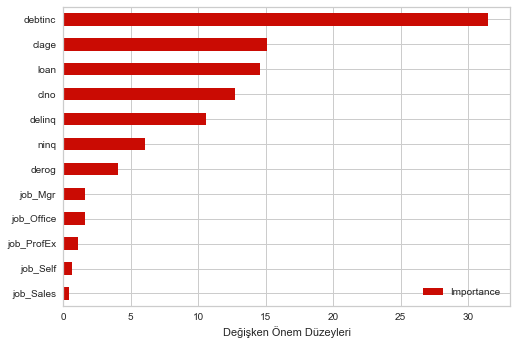

In [234]:
best_params = {}
rf_model = model.RF_Classification(X_train,X_test,y_train,y_test,best_params)

In [235]:
params = {"max_depth": [2,5,8,10],
            "max_features": [2,5,8],
            "n_estimators": [10,500,1000],
            "min_samples_split": [2,5,10]}

best_params = model.Model_Tuning(X_train= X_train,y_train = y_train,params= params,model=rf_model)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 365 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 648 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1013 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:  7.0min finished


En iyi parametreler: {'max_depth': 10, 'max_features': 8, 'min_samples_split': 2, 'n_estimators': 500}


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
------------------Accuracy Score------------------
0.9405940594059405
------------------confusion_matrix------------------
[[368   1]
 [ 23  12]]


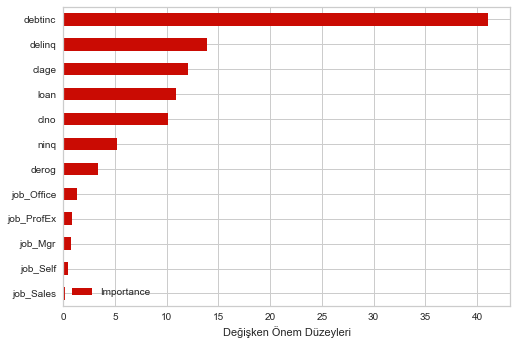

In [236]:
rf_model = model.RF_Classification(X_train,X_test,y_train,y_test,best_params)

# SVC

In [237]:
best_params = {}
svc_model = model.SVC(X_train,X_test,y_train,y_test,best_params)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
Test başarı oranı
0.9133663366336634
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       369
           1       0.00      0.00      0.00        35

    accuracy                           0.91       404
   macro avg       0.46      0.50      0.48       404
weighted avg       0.83      0.91      0.87       404

Train başarı oranı
0.9114002478314746
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      1471
           1       0.00      0.00      0.00       143

    accuracy                           0.91      1614
   macro avg       0.46      0.50      0.48      1614
weighted avg       0.83      0.91      0.87      1614



In [238]:
params = {"C": [0.0001, 0.001, 0.1, 1, 5, 10 ,50 ,100],
             "gamma": [0.0001, 0.001, 0.1, 1, 5, 10 ,50 ,100]}
best_params = model.Model_Tuning(X_train= X_train,y_train = y_train,params= params,model=svc_model)

Fitting 10 folds for each of 64 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 477 tasks      | elapsed:   21.9s


En iyi parametreler: {'C': 0.0001, 'gamma': 0.0001}


[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:   31.8s finished


In [239]:
svc_model = model.SVC(X_train,X_test,y_train,y_test,best_params)

SVC(C=0.0001, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
Test başarı oranı
0.9133663366336634
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       369
           1       0.00      0.00      0.00        35

    accuracy                           0.91       404
   macro avg       0.46      0.50      0.48       404
weighted avg       0.83      0.91      0.87       404

Train başarı oranı
0.9114002478314746
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      1471
           1       0.00      0.00      0.00       143

    accuracy                           0.91      1614
   macro avg       0.46      0.50      0.48      1614
weighted avg       0.83      0.91      0.87      1614



# KNeighborsClassifier

In [240]:
best_params = {}
knn_model = model.KNeighborsClassifier(X_train,X_test,y_train,y_test,best_params)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
0.905940594059406
              precision    recall  f1-score   support

           0       0.91      0.99      0.95       369
           1       0.20      0.03      0.05        35

    accuracy                           0.91       404
   macro avg       0.56      0.51      0.50       404
weighted avg       0.85      0.91      0.87       404



In [241]:
params = {"n_neighbors": np.arange(1,50), "metric"  :  ["minkowki", "euclidean", "manhattan" ]}
best_params = model.Model_Tuning(X_train= X_train,y_train = y_train,params= params,model=knn_model)

Fitting 10 folds for each of 147 candidates, totalling 1470 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 1348 tasks      | elapsed:    4.1s


En iyi parametreler: {'metric': 'euclidean', 'n_neighbors': 12}


[Parallel(n_jobs=-1)]: Done 1470 out of 1470 | elapsed:    4.6s finished


In [242]:
knn_model = model.KNeighborsClassifier(X_train,X_test,y_train,y_test,best_params)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=12, p=2,
                     weights='uniform')
0.9133663366336634
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       369
           1       0.00      0.00      0.00        35

    accuracy                           0.91       404
   macro avg       0.46      0.50      0.48       404
weighted avg       0.83      0.91      0.87       404



# CatBoostClassifier

In [243]:
best_params = {}
cat_model = model.CatBoostClassifier(X_train,X_test,y_train,y_test,best_params)

Learning rate set to 0.012639
0:	learn: 0.6782078	total: 4.9ms	remaining: 4.89s
1:	learn: 0.6629167	total: 8.34ms	remaining: 4.16s
2:	learn: 0.6495723	total: 11.9ms	remaining: 3.96s
3:	learn: 0.6349199	total: 15.5ms	remaining: 3.86s
4:	learn: 0.6243237	total: 18.2ms	remaining: 3.62s
5:	learn: 0.6114429	total: 21.9ms	remaining: 3.63s
6:	learn: 0.6002675	total: 25.5ms	remaining: 3.62s
7:	learn: 0.5878045	total: 30ms	remaining: 3.72s
8:	learn: 0.5763975	total: 33.9ms	remaining: 3.74s
9:	learn: 0.5645585	total: 37.5ms	remaining: 3.71s
10:	learn: 0.5535119	total: 40.9ms	remaining: 3.68s
11:	learn: 0.5441036	total: 44.9ms	remaining: 3.7s
12:	learn: 0.5333930	total: 48.8ms	remaining: 3.7s
13:	learn: 0.5235596	total: 52.2ms	remaining: 3.68s
14:	learn: 0.5139859	total: 55.6ms	remaining: 3.65s
15:	learn: 0.5045753	total: 59.2ms	remaining: 3.64s
16:	learn: 0.4955104	total: 62.7ms	remaining: 3.62s
17:	learn: 0.4865818	total: 66.4ms	remaining: 3.62s
18:	learn: 0.4774410	total: 69.9ms	remaining: 3.6

In [244]:
params = {
    'iterations': [200,500],
    'learning_rate': [0.01,0.05, 0.1],
    'depth': [3,5,8] }
best_params = model.Model_Tuning(X_train= X_train,y_train = y_train,params= params,model=cat_model)

Fitting 10 folds for each of 18 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:  3.6min finished


0:	learn: 0.6366612	total: 2.29ms	remaining: 1.14s
1:	learn: 0.5911801	total: 4.63ms	remaining: 1.15s
2:	learn: 0.5517253	total: 6.69ms	remaining: 1.11s
3:	learn: 0.5130948	total: 8.76ms	remaining: 1.09s
4:	learn: 0.4817336	total: 10.8ms	remaining: 1.07s
5:	learn: 0.4507766	total: 13ms	remaining: 1.07s
6:	learn: 0.4248030	total: 15.1ms	remaining: 1.06s
7:	learn: 0.4014121	total: 17.1ms	remaining: 1.05s
8:	learn: 0.3826885	total: 19.3ms	remaining: 1.05s
9:	learn: 0.3663157	total: 21.3ms	remaining: 1.04s
10:	learn: 0.3494558	total: 23.4ms	remaining: 1.04s
11:	learn: 0.3363912	total: 25.4ms	remaining: 1.03s
12:	learn: 0.3230946	total: 27.5ms	remaining: 1.03s
13:	learn: 0.3111461	total: 29.5ms	remaining: 1.02s
14:	learn: 0.3029568	total: 31.6ms	remaining: 1.02s
15:	learn: 0.2939831	total: 33.7ms	remaining: 1.02s
16:	learn: 0.2864842	total: 35.8ms	remaining: 1.02s
17:	learn: 0.2789214	total: 37.8ms	remaining: 1.01s
18:	learn: 0.2729717	total: 39.8ms	remaining: 1.01s
19:	learn: 0.2672218	tot

In [245]:
cat_model = model.CatBoostClassifier(X_train,X_test,y_train,y_test,best_params)

0:	learn: 0.6366612	total: 2.26ms	remaining: 1.13s
1:	learn: 0.5911801	total: 4.61ms	remaining: 1.15s
2:	learn: 0.5517253	total: 6.88ms	remaining: 1.14s
3:	learn: 0.5130948	total: 8.95ms	remaining: 1.11s
4:	learn: 0.4817336	total: 11.4ms	remaining: 1.13s
5:	learn: 0.4507766	total: 13.8ms	remaining: 1.13s
6:	learn: 0.4248030	total: 16ms	remaining: 1.13s
7:	learn: 0.4014121	total: 18.3ms	remaining: 1.13s
8:	learn: 0.3826885	total: 20.4ms	remaining: 1.11s
9:	learn: 0.3663157	total: 22.7ms	remaining: 1.11s
10:	learn: 0.3494558	total: 24.9ms	remaining: 1.11s
11:	learn: 0.3363912	total: 27ms	remaining: 1.1s
12:	learn: 0.3230946	total: 29.5ms	remaining: 1.1s
13:	learn: 0.3111461	total: 32.2ms	remaining: 1.12s
14:	learn: 0.3029568	total: 34.6ms	remaining: 1.12s
15:	learn: 0.2939831	total: 37.1ms	remaining: 1.12s
16:	learn: 0.2864842	total: 39.9ms	remaining: 1.13s
17:	learn: 0.2789214	total: 42.6ms	remaining: 1.14s
18:	learn: 0.2729717	total: 45.3ms	remaining: 1.15s
19:	learn: 0.2672218	total: 

In [246]:
modeller = [
    knn_model,
    loj_model,
    svc_model,
    mlpc,
    cart,
    rf_model,
    cat_model
    ]


for model in modeller:
    isimler = model.__class__.__name__
    y_pred = model.predict(X_test)
    dogruluk = accuracy_score(y_test, y_pred)
    print("-"*28)
    print(isimler + ":" )
    print("Accuracy: {:.4%}".format(dogruluk))

----------------------------
KNeighborsClassifier:
Accuracy: 91.3366%
----------------------------
LogisticRegression:
Accuracy: 92.0792%
----------------------------
SVC:
Accuracy: 91.3366%
----------------------------
MLPClassifier:
Accuracy: 91.3366%
----------------------------
DecisionTreeClassifier:
Accuracy: 93.0693%
----------------------------
RandomForestClassifier:
Accuracy: 94.0594%
----------------------------
CatBoostClassifier:
Accuracy: 94.0594%
